# Avance 4. Modelos Alternativos


En esta entrega se construyen y evalúan múltiples modelos individuales para resolver el problema de detección de miotubos con cajas orientadas (OBB).

Un aspecto clave de este proyecto es que trabajamos bajo un escenario de pseudo-labeling, esto es, las imágenes no contienen anotaciones exhaustivas, es decir, no todos los miotubos presentes están etiquetados. Esto introduce un desafío adicional: un modelo puede detectar correctamente un miotubo real que no está anotado y, desde la perspectiva de la evaluación estándar, esa detección podría contarse como “falso positivo”. Por ello, además de métricas cuantitativas (mAP, precisión/recall), se complementa el análisis con criterios de estabilidad, generalización y revisión cualitativa.

La libreta se divide en tres secciones:
- Comparativa: entrenamiento y comparación de 6 modelos individuales con el mismo protocolo experimental.
- Ajuste fino: selección de los 2 mejores y exploración de hiperparámetros para mejorar desempeño.
- Modelo individual final: elección del modelo final considerando rendimiento, costo computacional y robustez ante etiquetas incompletas.

In [1]:
!pip install ultralytics
import os
import random
import shutil
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import torch
#from shapely.geometry import Polygon
from ultralytics import YOLO
from pathlib import Path
from datetime import datetime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 20.5 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Comparativa

### Comparación de 6 Modelos

Para esta comparativa se entrenan seis modelos individuales basados en YOLO con soporte de detección OBB: tres variantes de YOLOv8 (n, s, m) y tres variantes de YOLO11 (n, s, m). La razón de evaluar múltiples versiones y tamaños permite capturar el efecto de dos factores que suelen dominar el rendimiento real:

1) Diferencias de arquitectura y versión (YOLOv8 vs YOLO11).
Aunque ambos pertenecen a la familia YOLO, cada versión introduce cambios en el backbone, el head y detalles de entrenamiento que pueden modificar la forma en que el modelo aprende bordes, texturas y patrones de forma. En tareas de detección con orientaciones variadas (OBB), esas diferencias pueden reflejarse directamente en qué tan bien se ajustan las cajas, qué tan estable es el aprendizaje por época y qué tan rápido converge.

2) Capacidad del modelo (n vs s vs m) y trade-offs de generalización.
Las variantes n (nano), s (small) y m (medium) permiten explorar el balance entre:
- Capacidad de representación, ya que modelos más grandes suelen capturar patrones más complejos.
- Riesgo de sobreajuste, particularmente importante cuando hay ruido o etiquetas incompletas.
- Costo computacional, tiempo de entrenamiento e inferencia.

Este punto es especialmente relevante porque el problema se aborda en un contexto de pseudo-labeling, es decir, las anotaciones disponibles no son exhaustivas y, por tanto, el dataset contiene miotubos reales no etiquetados. En este escenario, la evaluación tradicional puede subestimar a modelos “más detectores” (que encuentran más miotubos reales) porque algunas detecciones correctas podrían penalizarse como falsos positivos si el objeto no estaba anotado. Por eso, comparar modelos de distintas capacidades ayuda a identificar cuál ofrece el mejor equilibrio entre:
- detectar suficientes instancias (sensibilidad),
- evitar detecciones espurias (precisión),
- y mantener estabilidad sin “memorizar” únicamente el subconjunto etiquetado.

Para asegurar una comparación justa, todos los modelos se entrenan con un protocolo uniforme, es decir, mismo dataset, tamaño de imagen, batch, número de épocas y estrategia de augmentación.

In [19]:
data_path = Path ('/content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Volumes/data')
raw_split_path = Path('/content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Volumes/data/processed_2')
model_path = Path('/content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Volumes/models')

In [12]:
import yaml
data_config = {
    'train': str(raw_split_path / 'train' / 'images'),
    'val': str(raw_split_path / 'val' / 'images'),
    'test': str(raw_split_path / 'test' / 'images'),
    'nc': 1,
    'names': ['myotube']
}

with open(raw_split_path / 'data_processed.yaml', 'w') as f:
    yaml.dump(data_config, f)

In [20]:
data_yaml = str(raw_split_path / 'data_processed.yaml')

In [9]:
model_candidates = [
    "yolov8n-obb.pt",
    "yolov8s-obb.pt",
    "yolov8m-obb.pt",
    "yolo11n-obb.pt",
    "yolo11s-obb.pt",
    "yolo11m-obb.pt",
]

summary = []

In [17]:
for model_name in model_candidates:
    exp_name = f"{Path(model_name).stem}_torneo_e150_img1024_b16"
    run_dir = model_path / exp_name
    last_pt = run_dir / "weights" / "last.pt"

    if last_pt.exists():
        model = YOLO(str(last_pt))
        train_kwargs = dict(resume=True)
    else:
        model = YOLO(model_name)
        train_kwargs = dict(
            data=str(data_yaml),
            epochs=150,
            imgsz=1024,
            batch=16,
            device=0,
            cos_lr=True,
            patience=40,
            seed=42,
        )

    model.train(
        project=str(model_path),
        name=exp_name,
        exist_ok=True,
        save=True,
        save_period=1,
        close_mosaic=20,
        degrees=180.0,
        flipud=0.5,
        fliplr=0.5,
        mosaic=0.5,
        mixup=0.1,
        scale=0.3,
        **train_kwargs
    )

    results_csv = run_dir / "results.csv"
    if results_csv.exists():
        df = pd.read_csv(results_csv)

        metric_cols = [c for c in df.columns if ("mAP50-95" in c) or ("mAP50" in c)]
        if metric_cols:
            metric = metric_cols[0]
            best_idx = df[metric].idxmax()
            best_row = df.loc[best_idx]
            best_epoch = int(best_row.get("epoch", best_idx))
            best_metric = float(best_row.get(metric))
        else:
            best_epoch = int(df.iloc[-1].get("epoch", len(df) - 1))
            best_metric = float("nan")
            metric = "N/A"

        summary.append({
            "model": model_name,
            "run": exp_name,
            "best_epoch": best_epoch,
            "metric": metric,
            "best_value": best_metric,
        })



Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=20, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Volumes/data/processed_2/data_processed.yaml, degrees=180.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8n-obb.pt, momentum=0.937, mosaic=0.5, multi_scale=0.0, name=yolov8n-obb_torneo_e1

In [19]:
leaderboard = pd.DataFrame(summary).sort_values("best_value", ascending=False)
print(leaderboard.to_string(index=False))

         model                                 run  best_epoch           metric  best_value
yolo11s-obb.pt yolo11s-obb_torneo_e150_img1024_b16          89 metrics/mAP50(B)     0.77176
yolov8m-obb.pt yolov8m-obb_torneo_e150_img1024_b16          51 metrics/mAP50(B)     0.76859
yolo11m-obb.pt yolo11m-obb_torneo_e150_img1024_b16          50 metrics/mAP50(B)     0.76218
yolov8s-obb.pt yolov8s-obb_torneo_e150_img1024_b16          82 metrics/mAP50(B)     0.76057
yolov8n-obb.pt yolov8n-obb_torneo_e150_img1024_b16          85 metrics/mAP50(B)     0.75660
yolo11n-obb.pt yolo11n-obb_torneo_e150_img1024_b16          82 metrics/mAP50(B)     0.75094


In [22]:
runs = []
for model_name in model_candidates:
    exp_name = f"{Path(model_name).stem}_torneo_e150_img1024_b16"
    run_dir = model_path / exp_name
    results_csv = run_dir / "results.csv"
    best_pt = run_dir / "weights" / "best.pt"
    last_pt = run_dir / "weights" / "last.pt"

    last_epoch = None
    n_rows = None
    if results_csv.exists():
        df = pd.read_csv(results_csv)
        if "epoch" in df.columns:
            last_epoch = int(df["epoch"].max())
        n_rows = int(len(df))

    runs.append({
        "run": exp_name,
        "has_results_csv": results_csv.exists(),
        "has_best_pt": best_pt.exists(),
        "has_last_pt": last_pt.exists(),
        "last_epoch": last_epoch,
        "rows_in_results": n_rows,
    })

pd.DataFrame(runs)

,run,has_results_csv,has_best_pt,has_last_pt,last_epoch,rows_in_results
0,yolov8n-obb_torneo_e150_img1024_b16,True,True,True,119,119
1,yolov8s-obb_torneo_e150_img1024_b16,True,True,True,122,122
2,yolov8m-obb_torneo_e150_img1024_b16,True,True,False,127,127
3,yolo11n-obb_torneo_e150_img1024_b16,True,True,True,122,122
4,yolo11s-obb_torneo_e150_img1024_b16,True,True,True,136,136
5,yolo11m-obb_torneo_e150_img1024_b16,True,False,False,113,113


In [21]:
RUN_SUFFIX = "_torneo_e150_img1024_b16"

def pick_col(df, candidates):
    """Devuelve la primera columna de df que exista dentro de candidates, o None."""
    for c in candidates:
        if c in df.columns:
            return c
    return None

def load_results_csv(run_dir: Path):
    p = run_dir / "results.csv"
    if not p.exists():
        return None
    df = pd.read_csv(p)
    if "epoch" not in df.columns:
        df["epoch"] = np.arange(len(df))
    return df

def plot_training_curves(model_path: Path, model_candidates, run_suffix=RUN_SUFFIX):
    runs = []
    for model_name in model_candidates:
        exp_name = f"{Path(model_name).stem}{run_suffix}"
        run_dir = model_path / exp_name
        df = load_results_csv(run_dir)
        if df is None:
            print(f"[WARN] No existe results.csv para: {exp_name}")
            continue
        runs.append((model_name, exp_name, run_dir, df))

    if len(runs) == 0:
        raise RuntimeError("No se encontraron results.csv. Revisa model_path y nombres de runs.")

    c_map50     = ["metrics/mAP50(B)", "metrics/mAP50"]
    c_map5095   = ["metrics/mAP50-95(B)", "metrics/mAP50-95"]
    c_prec      = ["metrics/precision(B)", "metrics/precision"]
    c_rec       = ["metrics/recall(B)", "metrics/recall"]

    fig, axes = plt.subplots(3, 2, figsize=(18, 14), sharex=True)
    axes = axes.flatten()

    for i, (model_name, exp_name, run_dir, df) in enumerate(runs[:6]):
        ax = axes[i]
        x = df["epoch"].values

        col_map50   = pick_col(df, c_map50)
        col_map5095 = pick_col(df, c_map5095)
        col_prec    = pick_col(df, c_prec)
        col_rec     = pick_col(df, c_rec)

        any_plotted = False
        if col_map50 is not None:
            ax.plot(x, df[col_map50].values, label=col_map50)
            any_plotted = True
        if col_map5095 is not None:
            ax.plot(x, df[col_map5095].values, label=col_map5095)
            any_plotted = True
        if col_prec is not None:
            ax.plot(x, df[col_prec].values, label=col_prec)
            any_plotted = True
        if col_rec is not None:
            ax.plot(x, df[col_rec].values, label=col_rec)
            any_plotted = True

        ax.set_title(exp_name)
        ax.set_xlabel("epoch")
        ax.set_ylabel("score")
        ax.grid(True, alpha=0.3)
        if any_plotted:
            ax.legend(fontsize=8, loc="best")

    # Si hay menos de 6 runs, apaga ejes sobrantes
    for j in range(len(runs[:6]), 6):
        axes[j].axis("off")

    fig.suptitle("Curvas de entrenamiento por modelo (mAP/precision/recall)", y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()

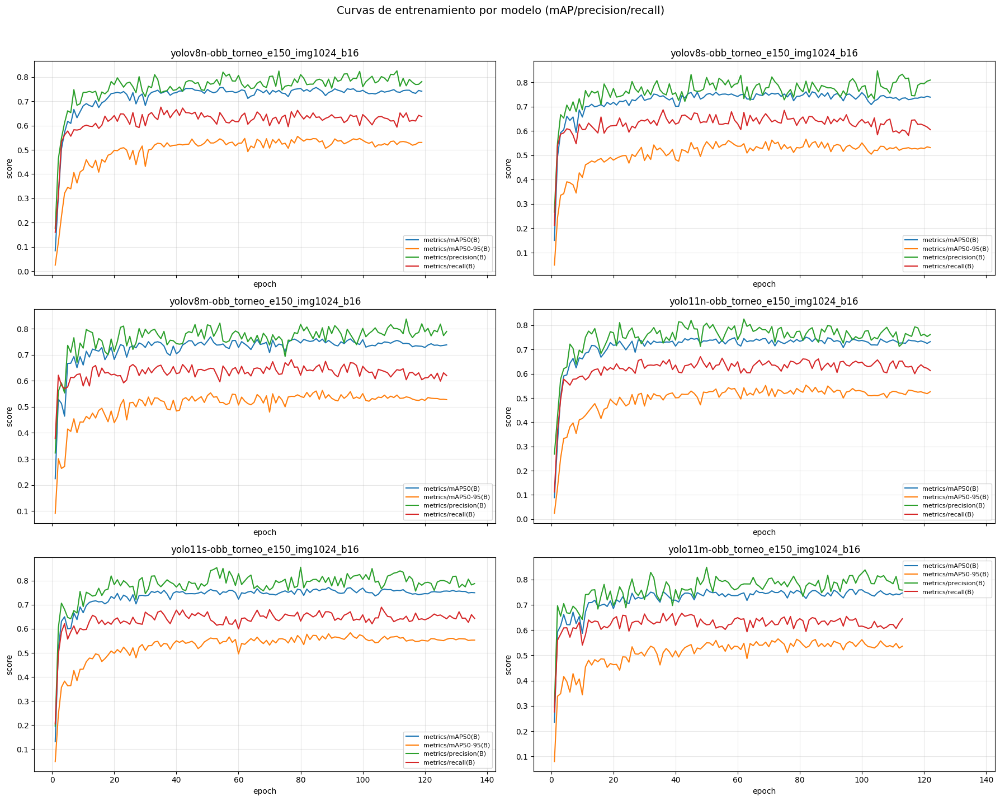

In [15]:
plot_training_curves(model_path=model_path, model_candidates=model_candidates)

In [16]:
def best_metrics_table_simple(model_path: Path, model_candidates, run_suffix=RUN_SUFFIX):
    rows = []

    for model_name in model_candidates:
        exp_name = f"{Path(model_name).stem}{run_suffix}"
        run_dir = Path(model_path) / exp_name
        results_csv = run_dir / "results.csv"

        if not results_csv.exists():
            print(f"[WARN] No existe: {results_csv}")
            continue

        df = pd.read_csv(results_csv)

        # best epoch según mAP50(B)
        best_idx = df["metrics/mAP50(B)"].idxmax()
        best_row = df.loc[best_idx]

        rows.append({
            "model": model_name,
            "run": exp_name,
            "best_epoch": int(best_row.get("epoch", best_idx)),
            "mAP50(B)": float(best_row["metrics/mAP50(B)"]),
            "mAP50-95(B)": float(best_row["metrics/mAP50-95(B)"]) if "metrics/mAP50-95(B)" in df.columns else None,
            "precision(B)": float(best_row["metrics/precision(B)"]) if "metrics/precision(B)" in df.columns else None,
            "recall(B)": float(best_row["metrics/recall(B)"]) if "metrics/recall(B)" in df.columns else None,
        })

    out = pd.DataFrame(rows).sort_values("mAP50(B)", ascending=False).reset_index(drop=True)
    return out

leaderboard_best = best_metrics_table_simple(model_path, model_candidates)
leaderboard_best

,model,run,best_epoch,mAP50(B),mAP50-95(B),precision(B),recall(B)
0,yolo11s-obb.pt,yolo11s-obb_torneo_e150_img1024_b16,89,0.77176,0.57903,0.81316,0.67067
1,yolov8m-obb.pt,yolov8m-obb_torneo_e150_img1024_b16,51,0.76859,0.55368,0.81080,0.64800
2,yolo11m-obb.pt,yolo11m-obb_torneo_e150_img1024_b16,50,0.76218,0.54991,0.84900,0.62133
3,yolov8s-obb.pt,yolov8s-obb_torneo_e150_img1024_b16,82,0.76057,0.56609,0.80447,0.63067
4,yolov8n-obb.pt,yolov8n-obb_torneo_e150_img1024_b16,85,0.75660,0.54541,0.78627,0.63333
5,yolo11n-obb.pt,yolo11n-obb_torneo_e150_img1024_b16,82,0.75094,0.55293,0.76508,0.66000


### Comparación del rendimiento obtenido (entrenamiento/validación)

Las curvas muestran una convergencia rápida en las primeras épocas y luego una meseta relativamente estable para mAP50, mAP50-95, precisión y recall, lo que sugiere que el protocolo de entrenamiento es consistente entre modelos y que no hay inestabilidad marcada.

En el leaderboard por mAP50(B), el mejor desempeño lo obtiene yolo11s-obb (0.77176), seguido muy de cerca por yolov8m-obb (0.76859) y yolo11m-obb (0.76218). Estos tres modelos forman el grupo líder, con diferencias pequeñas, lo que indica que la elección final no debe basarse solo en una métrica puntual.

Bajo el escenario de pseudo-labeling (etiquetas no exhaustivas), conviene interpretar con cautela precisión y recall, ya que detecciones correctas sobre miotubos no etiquetados pueden penalizarse como falsos positivos, afectando las métricas. Por ello, esta comparativa se considera un ranking preliminar basado en entrenamiento/validación; la selección definitiva se hará al evaluar los modelos en el conjunto de evaluación (test).

### Comparación del rendimiento obtenido (evaluacion)


Después de analizar el comportamiento durante entrenamiento/validación (curvas y métricas por época), el siguiente paso es realizar una comparativa utilizando el conjunto de evaluación (test). Esta comparación es importante porque permite estimar mejor la capacidad de generalización de cada modelo en datos no vistos durante el entrenamiento y, por lo tanto, tomar una decisión más informada para seleccionar finalistas.

En esta sección se evalúan los seis modelos individuales entrenados (YOLOv8 y YOLO11 en variantes n/s/m, todos en configuración OBB) utilizando el split `test` definido en el archivo `data_processed.yaml`. Para asegurar consistencia, cada modelo se evalúa a partir de su checkpoint de mejor desempeño (`best.pt`; o `last.pt` si no está disponible). Las métricas reportadas incluyen mAP@50, mAP@50-95, precision y recall, lo que permite comparar de forma cuantitativa el rendimiento relativo entre arquitecturas y tamaños.

In [22]:
from time import perf_counter

In [23]:
def load_checkpoint_for_run(run_dir: Path, prefer="best"):
    wdir = run_dir / "weights"
    best_pt = wdir / "best.pt"
    last_pt = wdir / "last.pt"

    if prefer == "best":
        if best_pt.exists():
            return best_pt
        if last_pt.exists():
            return last_pt
    else:
        if last_pt.exists():
            return last_pt
        if best_pt.exists():
            return best_pt

    return None

def extract_metrics(metrics_obj):
    m = metrics_obj.box if hasattr(metrics_obj, "box") else metrics_obj
    return {
        "mAP50(B)": float(m.map50) if hasattr(m, "map50") else np.nan,
        "mAP50-95(B)": float(m.map) if hasattr(m, "map") else np.nan,
        "precision(B)": float(m.mp) if hasattr(m, "mp") else np.nan,
        "recall(B)": float(m.mr) if hasattr(m, "mr") else np.nan,
    }

def evaluate_runs_on_test(model_path: Path, model_candidates, data_yaml: str, run_suffix=RUN_SUFFIX, prefer_ckpt="best", device=0):
    rows = []

    for model_name in model_candidates:
        exp_name = f"{Path(model_name).stem}{run_suffix}"
        run_dir = Path(model_path) / exp_name

        if not run_dir.exists():
            print(f"[WARN] No existe run_dir: {run_dir}")
            continue

        ckpt = load_checkpoint_for_run(run_dir, prefer=prefer_ckpt)
        if ckpt is None:
            print(f"[WARN] No encontré best.pt/last.pt en: {run_dir}")
            continue

        model = YOLO(str(ckpt))

        t0 = perf_counter()
        metrics = model.val(data=str(data_yaml), split="test", device=device, verbose=False)
        t1 = perf_counter()

        met = extract_metrics(metrics)

        rows.append({
            "model": model_name,
            "run": exp_name,
            "ckpt": ckpt.name,
            "eval_time_sec": round(t1 - t0, 3),
            **met
        })

    df = pd.DataFrame(rows)

    # Orden por mAP50 y desempate por mAP50-95
    if len(df) > 0:
        df = df.sort_values(["mAP50(B)", "mAP50-95(B)"], ascending=False).reset_index(drop=True)

    return df

leaderboard_test = evaluate_runs_on_test(
    model_path=model_path,
    model_candidates=model_candidates,
    data_yaml=data_yaml,
    prefer_ckpt="best",
    device=0
)



Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
YOLOv8n-obb summary (fused): 82 layers, 3,077,414 parameters, 0 gradients, 8.3 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 28.1±4.2 MB/s, size: 11082.2 KB)
val: Scanning /content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Volumes/data/processed_2/test/labels... 32 images, 2 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 32/32 11.8it/s 2.7s
val: New cache created: /content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Volumes/data/processed_2/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.8s/it 3.6s
                   all         32        489      0.842      0.787      0.885       0.58
Speed: 5.5ms preprocess, 5.9ms inference, 0.0ms loss, 11.9ms postprocess per image
Results saved to /content/runs/obb/val2
Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM

In [24]:
leaderboard_test

,model,run,ckpt,eval_time_sec,mAP50(B),mAP50-95(B),precision(B),recall(B)
0,yolo11s-obb.pt,yolo11s-obb_torneo_e150_img1024_b16,best.pt,9.055,0.888885,0.587575,0.847674,0.815951
1,yolo11n-obb.pt,yolo11n-obb_torneo_e150_img1024_b16,best.pt,9.595,0.888042,0.590686,0.829014,0.822945
2,yolov8s-obb.pt,yolov8s-obb_torneo_e150_img1024_b16,best.pt,8.984,0.887657,0.591941,0.817537,0.815951
3,yolo11m-obb.pt,yolo11m-obb_torneo_e150_img1024_b16,best.pt,9.622,0.885374,0.573900,0.825275,0.801700
4,yolov8n-obb.pt,yolov8n-obb_torneo_e150_img1024_b16,best.pt,15.743,0.885041,0.580120,0.842447,0.787296
5,yolov8m-obb.pt,yolov8m-obb_torneo_e150_img1024_b16,best.pt,9.614,0.864476,0.576207,0.837374,0.747619


### Selección de los dos modelos con el mejor rendimiento

La evaluación en el conjunto de prueba muestra un desempeño alto y relativamente cercano entre los modelos, lo cual sugiere que el problema y el etiquetado por pseudo-labeling permite varias soluciones competitivas bajo el mismo protocolo de entrenamiento.

Ordenando por mAP50(B), el mejor resultado lo obtiene yolo11s-obb con 0.888885, seguido muy de cerca por yolo11n-obb con 0.888042 y yolov8s-obb con 0.887657. En términos prácticos, las diferencias de mAP50 entre los tres primeros son marginales, por lo que también es relevante considerar mAP50-95, precision y recall para decidir finalistas.

En mAP50-95(B) destacan yolov8s-obb (0.591941) y yolo11n-obb (0.590686), mientras que yolo11s-obb mantiene un rendimiento muy competitivo (0.587575) y además presenta una precision elevada (0.847674). En recall(B), yolo11n-obb es el más alto (0.822945), lo que sugiere mayor cobertura de detecciones en el test, aunque bajo pseudo-labeling esto debe interpretarse con cautela debido a la posible presencia de objetos reales no anotados.

Selección preliminar de finalistas:
- Finalista 1: yolo11s-obb (mejor mAP50 y mejor precision).
- Finalista 2: yolo11n-obb (mAP50 prácticamente empatado y el mejor recall, además de mAP50-95 alto).


## 2. Ajuste Fino

### Ajustar los dos mejores modelos

Con los dos modelos finalistas seleccionados a partir de la evaluación en el conjunto de prueba (test), el siguiente paso es realizar ajuste fino para intentar mejorar su desempeño. A diferencia de la etapa de comparativa, donde todos los modelos se entrenaron bajo un protocolo fijo para poder compararlos de forma justa, en esta sección se permite modificar hiperparámetros y condiciones de entrenamiento con el objetivo de obtener una configuración más adecuada para el problema.

El contexto de pseudo-labeling es especialmente relevante aquí, ya que aquí las anotaciones no son exhaustivas y pueden contener omisiones, por lo que un entrenamiento excesivamente largo o agresivo puede llevar a sobreajuste sobre el subconjunto etiquetado. Por esta razón, el ajuste fino se enfoca en cambios de alto impacto que suelen mejorar generalización sin disparar el costo computacional, como incrementar moderadamente el número de épocas junto con mayor paciencia (early stopping más tolerante), incorporar regularización (por ejemplo AdamW y weight decay) y ajustar la intensidad de augmentación si se detecta ruido en las etiquetas.

En esta sección se entrena un pequeño conjunto de variantes para cada finalista, se comparan nuevamente sus métricas en el conjunto de evaluación y se selecciona la mejor configuración de cada modelo para la etapa final de decisión.

In [26]:
finalist_runs = [
    "yolo11s-obb_torneo_e150_img1024_b16",
    "yolo11n-obb_torneo_e150_img1024_b16",
]

def get_best_ckpt(run_dir: Path):
    best_pt = run_dir / "weights" / "best.pt"
    last_pt = run_dir / "weights" / "last.pt"
    if best_pt.exists():
        return best_pt
    if last_pt.exists():
        return last_pt
    return None

train_base = dict(
    data=str(data_yaml),
    imgsz=1024,
    batch=16,
    device=0,
    seed=42,
    cos_lr=True,
    save=True,
    save_period=1,
    exist_ok=True,
    epochs=200,
    patience=60,
)

aug_base = dict(
    close_mosaic=20,
    degrees=180.0,
    flipud=0.5,
    fliplr=0.5,
    mosaic=0.5,
    mixup=0.1,
    scale=0.3,
)

# Variantes: 'tag' solo se usa para nombrar, NO se pasa a train()
tune_variants = [
    ("ft_A_control", {}),

    ("ft_B_adamw_reg", dict(
        optimizer="AdamW",
        weight_decay=0.001,
        label_smoothing=0.05,
        lr0=0.003,
        lrf=0.12
    )),

    ("ft_C_less_aug", dict(
        mosaic=0.3,
        mixup=0.05,
        degrees=90.0,
        close_mosaic=10
    )),
]

for run_name in finalist_runs:
    run_dir = Path(model_path) / run_name
    ckpt = get_best_ckpt(run_dir)
    if ckpt is None:
        print(f"[WARN] No encontré best.pt/last.pt en {run_dir}")
        continue

    print(f"\n=== Ajuste fino para: {run_name} | init: {ckpt.name} ===")

    for tag, overrides in tune_variants:
        new_name = f"{run_name}__{tag}"
        print(f"Entrenando: {new_name}")

        model = YOLO(str(ckpt))  # fine-tune desde best.pt

        train_kwargs = {}
        train_kwargs.update(train_base)
        train_kwargs.update(aug_base)
        train_kwargs.update(overrides)  # aquí ya no entra 'tag'

        model.train(
            project=str(model_path),
            name=new_name,
            **train_kwargs
        )

print("Ajuste fino completado.")


=== Ajuste fino para: yolo11s-obb_torneo_e150_img1024_b16 | init: best.pt ===
Entrenando: yolo11s-obb_torneo_e150_img1024_b16__ft_A_control
Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=20, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Volumes/data/processed_2/data_processed.yaml, degrees=180.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=200, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, ma

### Elegir el modelo individual final


En esta sección se selecciona el modelo individual final a partir de los dos finalistas obtenidos en la etapa de comparativa y sus variantes resultantes del ajuste fino. La selección no se basa únicamente en el desempeño observado durante entrenamiento/validación, sino en una evaluación controlada sobre el conjunto de evaluación (test), ya que este split representa mejor la capacidad de generalización del modelo en datos no vistos.

En esta evaluación se declarará como ganador el modelo que maximice la métrica principal en test; en caso de diferencias marginales, se utiliza mAP50-95(B) como criterio de desempate y se considera el balance precision–recall para justificar la decisión, especialmente por el contexto de pseudo-labeling.

In [28]:
ft_run_names = [
    "yolo11s-obb_torneo_e150_img1024_b16__ft_A_control",
    "yolo11s-obb_torneo_e150_img1024_b16__ft_B_adamw_reg",
    "yolo11s-obb_torneo_e150_img1024_b16__ft_C_less_aug",
    "yolo11n-obb_torneo_e150_img1024_b16__ft_A_control",
    "yolo11n-obb_torneo_e150_img1024_b16__ft_B_adamw_reg",
    "yolo11n-obb_torneo_e150_img1024_b16__ft_C_less_aug",
]

rows = []
for run_name in ft_run_names:
    run_dir = Path(model_path) / run_name
    ckpt = run_dir / "weights" / "best.pt"
    if not ckpt.exists():
        print(f"[WARN] No encontré {ckpt}")
        continue

    model = YOLO(str(ckpt))

    t0 = perf_counter()
    metrics = model.val(data=str(data_yaml), split="test", device=0, verbose=False)
    t1 = perf_counter()

    m = metrics.box if hasattr(metrics, "box") else metrics

    rows.append({
        "run": run_name,
        "mAP50(B)": float(m.map50),
        "mAP50-95(B)": float(m.map),
        "precision(B)": float(m.mp),
        "recall(B)": float(m.mr),
        "eval_time_sec": round(t1 - t0, 3),
    })

leaderboard_ft_test = pd.DataFrame(rows).sort_values(
    ["mAP50(B)", "mAP50-95(B)"], ascending=False
).reset_index(drop=True)

leaderboard_ft_test

Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
YOLO11s-obb summary (fused): 110 layers, 9,699,174 parameters, 0 gradients, 22.3 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 865.6±102.0 MB/s, size: 11137.8 KB)
val: Scanning /content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Volumes/data/processed_2/test/labels.cache... 32 images, 2 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 32/32 12.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.5s/it 5.1s
                   all         32        489      0.805      0.811      0.887      0.587
Speed: 5.6ms preprocess, 2.6ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to /content/runs/obb/val8
Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
YOLO11s-obb summary (fused): 110 layers, 9,699,174 parameters, 0 gradients, 22.3 GFLOPs
val: Fast im

,run,mAP50(B),mAP50-95(B),precision(B),recall(B),eval_time_sec
0,yolo11s-obb_torneo_e150_img1024_b16__ft_A_control,0.887447,0.586777,0.805115,0.811042,9.427
1,yolo11n-obb_torneo_e150_img1024_b16__ft_C_less...,0.887030,0.586549,0.814490,0.826035,9.848
2,yolo11n-obb_torneo_e150_img1024_b16__ft_A_control,0.885908,0.586970,0.823246,0.838174,9.616
3,yolo11s-obb_torneo_e150_img1024_b16__ft_C_less...,0.883337,0.593158,0.834700,0.795131,9.819
4,yolo11n-obb_torneo_e150_img1024_b16__ft_B_adam...,0.878588,0.576202,0.836296,0.801636,9.625
5,yolo11s-obb_torneo_e150_img1024_b16__ft_B_adam...,0.874916,0.570950,0.852633,0.773006,9.710


Con base en la tabla comparativa final sobre el conjunto de evaluación (test), el modelo con mejor desempeño en la métrica principal mAP50(B) fue:

- Modelo ganador: yolo11s-obb
- Configuración seleccionada: yolo11s-obb_torneo_e150_img1024_b16__ft_A_control
- Checkpoint evaluado: best.pt
- Desempeño en test:
  - mAP50(B) = 0.887447
  - mAP50-95(B) = 0.586777
  - precision(B) = 0.805115
  - recall(B) = 0.811042

Aunque existen configuraciones con valores cercanos, por ejemplo yolo11n-obb_torneo_e150_img1024_b16__ft_C_less_aug con mAP50(B) = 0.887030 y un recall ligeramente mayor), la diferencia en mAP50(B) favorece a yolo11s-obb con ft_A_control, y su balance entre precisión y cobertura es consistente. Por lo tanto, se selecciona esta configuración como el modelo individual final para el proyecto. Dado el contexto de pseudo-labeling y etiquetas incompletas, este resultado se interpreta como la mejor opción cuantitativa en test y con un desempeño estable, manteniendo un equilibrio adecuado entre precision y recall.

In [36]:
def read_myotube_labels(label_path, img_w, img_h):
    """Lee etiquetas de 9 columnas y las escala a píxeles reales."""
    from shapely.geometry import Polygon
    polys = []
    if not Path(label_path).exists():
        return polys

    with open(label_path, "r") as f:
        for line in f:
            parts = list(map(float, line.strip().split()))
            # Formato: clase x1 y1 x2 y2 x3 y3 x4 y4 (normalizado)
            if len(parts) == 9:
                pts = [
                    (parts[1] * img_w, parts[2] * img_h),
                    (parts[3] * img_w, parts[4] * img_h),
                    (parts[5] * img_w, parts[6] * img_h),
                    (parts[7] * img_w, parts[8] * img_h),
                ]
                polys.append(Polygon(pts))
    return polys

def _ensure_poly_pts(poly_pts):
    """Asegura que poly_pts sea (4,2). Si viene plano (8,), lo reshapea."""
    poly_pts = np.array(poly_pts)
    if poly_pts.shape == (8,):
        poly_pts = poly_pts.reshape(4, 2)
    return poly_pts

def visualize_qa_samples(
    model,
    img_dir,
    label_dir,
    num_samples=6,
    conf=0.10,
    imgsz=1024,
    seed=42
):
    """
    Visualiza predicciones detectando automáticamente formatos OBB o HBB.
    Ground Truth (Azul) y Predicciones (Rojo) con confianza.
    """
    GT_COLOR = "#3498db"    # Azul
    PRED_COLOR = "#e74c3c"  # Rojo

    random.seed(seed)

    img_dir = Path(img_dir)
    label_dir = Path(label_dir)

    # Soporta varias extensiones comunes
    exts = ["*.png", "*.jpg", "*.jpeg", "*.tif", "*.tiff"]
    img_files = []
    for e in exts:
        img_files += list(img_dir.glob(e))
    img_files = sorted(img_files)

    if not img_files:
        print(f"No se encontraron imágenes en {img_dir} con extensiones {exts}")
        return

    samples = random.sample(img_files, min(num_samples, len(img_files)))

    cols = 2
    rows = (len(samples) + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(20, 8 * rows))
    axs = np.array(axs).ravel()

    for i, img_path in enumerate(samples):
        # Leer imagen para mostrar (RGB)
        img_bgr = cv2.imread(str(img_path))
        if img_bgr is None:
            print(f"[WARN] No pude leer: {img_path}")
            axs[i].axis("off")
            continue

        img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape

        # Inferencia (más estable con path)
        res = model.predict(source=str(img_path), conf=conf, verbose=False, imgsz=imgsz)[0]

        # Ground Truth (Azul)
        label_path = label_dir / f"{img_path.stem}.txt"
        gt_polys = read_myotube_labels(label_path, w, h)

        axs[i].imshow(img)

        # Dibujar GT
        for poly in gt_polys:
            if poly.is_valid:
                x_pts, y_pts = poly.exterior.xy
                axs[i].plot(x_pts, y_pts, color=GT_COLOR, linewidth=2.5, alpha=0.85)

        # Dibujar Predicciones (Rojo)
        num_detections = 0

        # Caso OBB
        if hasattr(res, "obb") and res.obb is not None and len(res.obb) > 0:
            num_detections = len(res.obb)
            obb_coords = res.obb.xyxyxyxy.cpu().numpy()
            confs = res.obb.conf.cpu().numpy()

            for poly_pts, c in zip(obb_coords, confs):
                poly_pts = _ensure_poly_pts(poly_pts)
                poly_to_plot = np.vstack([poly_pts, poly_pts[0]])
                axs[i].plot(poly_to_plot[:, 0], poly_to_plot[:, 1], color=PRED_COLOR, linewidth=2)

                axs[i].text(
                    poly_pts[0, 0], poly_pts[0, 1] - 5, f"{c:.2f}",
                    color="white", fontsize=9, fontweight="bold",
                    bbox=dict(facecolor=PRED_COLOR, alpha=0.70, edgecolor="none", pad=1)
                )

        # Caso HBB
        elif hasattr(res, "boxes") and res.boxes is not None and len(res.boxes) > 0:
            num_detections = len(res.boxes)
            boxes = res.boxes.xyxy.cpu().numpy()
            confs = res.boxes.conf.cpu().numpy()

            for b, c in zip(boxes, confs):
                x1, y1, x2, y2 = b
                rect = patches.Rectangle(
                    (x1, y1), x2 - x1, y2 - y1,
                    linewidth=2, edgecolor=PRED_COLOR, facecolor="none"
                )
                axs[i].add_patch(rect)

                axs[i].text(
                    x1, y1 - 5, f"{c:.2f}",
                    color="white", fontsize=9, fontweight="bold",
                    bbox=dict(facecolor=PRED_COLOR, alpha=0.70, edgecolor="none", pad=1)
                )

        axs[i].set_title(
            f"Muestra: {img_path.name}\nDetecciones: {num_detections} | conf={conf}",
            fontsize=14, pad=10
        )
        axs[i].axis("off")

    # Ocultar subplots vacíos
    for j in range(i + 1, len(axs)):
        axs[j].axis("off")

    plt.tight_layout()
    plt.show()

In [37]:
best_run = "yolo11s-obb_torneo_e150_img1024_b16__ft_A_control"
best_pt = Path(model_path) / best_run / "weights" / "best.pt"
model_winner = YOLO(str(best_pt))

TEST_IMAGES = Path(raw_split_path) / "test" / "images"
TEST_LABELS = Path(raw_split_path) / "test" / "labels"

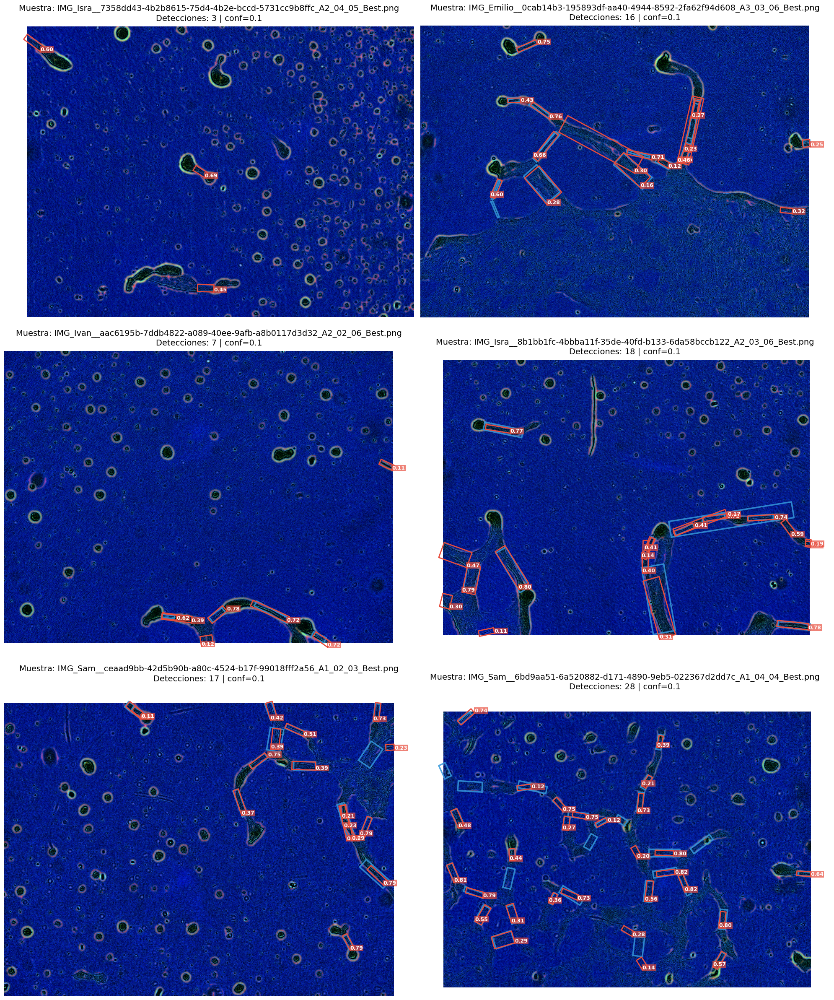

In [38]:
visualize_qa_samples(model_winner, TEST_IMAGES, TEST_LABELS, num_samples=6, conf=0.10, imgsz=1024)